In [1]:
import tensorflow as tf
import tensorflow.keras as K
import tensorflow.keras.layers as ll
import tensorflow.keras.optimizers as optim
import tensorflow.keras.losses as losses

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import os

#Tensorflow 2.x GPU limitation
gpus = tf.config.experimental.list_physical_devices('GPU')
num_gpu = 1
memory_limit = 1024*4
if gpus :
    try :
        tf.config.experimental.set_virtual_device_configuration(gpus[num_gpu-1], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit = memory_limit)])
        print("Use {} GPU limited {}MB memory".format(num_gpu, memory_limit))
    except RuntimeError as e :
        print(e)

# Actual training data
train_steer = pd.read_csv('Train_capture/steering.csv')
train_img = os.listdir('Train_capture/img')
        
# Validation data
dlog = pd.read_csv('validation_data/driving_log.csv', names=['center','left','right','steering','throttle', 'break', 'speed'] )
dlog.center = dlog.center.apply(lambda x: x[72:].replace('\\','/'))
dlog.left = dlog.left.apply(lambda x: x[72:].replace('\\','/'))
dlog.right = dlog.right.apply(lambda x: x[72:].replace('\\','/'))

dlog.head()

Use 1 GPU limited 4096MB memory


,center,left,right,steering,throttle,break,speed
0,validation_data/IMG/center_2020_04_07_04_12_05...,validation_data/IMG/left_2020_04_07_04_12_05_9...,validation_data/IMG/right_2020_04_07_04_12_05_...,-0.009434,0.0,0,9.578921
1,validation_data/IMG/center_2020_04_07_04_12_06...,validation_data/IMG/left_2020_04_07_04_12_06_0...,validation_data/IMG/right_2020_04_07_04_12_06_...,-0.009434,0.0,0,9.521108
2,validation_data/IMG/center_2020_04_07_04_12_06...,validation_data/IMG/left_2020_04_07_04_12_06_1...,validation_data/IMG/right_2020_04_07_04_12_06_...,-0.009434,0.0,0,9.463654
3,validation_data/IMG/center_2020_04_07_04_12_06...,validation_data/IMG/left_2020_04_07_04_12_06_1...,validation_data/IMG/right_2020_04_07_04_12_06_...,-0.009434,0.0,0,9.387581
4,validation_data/IMG/center_2020_04_07_04_12_06...,validation_data/IMG/left_2020_04_07_04_12_06_2...,validation_data/IMG/right_2020_04_07_04_12_06_...,-0.009434,0.0,0,9.330933


In [2]:
dlog[['steering','throttle','break','speed']].describe()

,steering,throttle,break,speed
count,2797.000000,2797.000000,2797.0,2797.000000
mean,0.025964,0.074298,0.0,9.065184
std,0.088532,0.082401,0.0,0.304721
min,-0.424528,0.000000,0.0,7.608748
25%,-0.009434,0.000000,0.0,8.876772
50%,0.028302,0.043154,0.0,9.034074
75%,0.066038,0.143944,0.0,9.194744
max,0.301887,0.331947,0.0,10.437590


In [3]:
train_steer.describe()

,steering
count,1176.000000
mean,-0.047226
std,0.103617
min,-0.488173
25%,-0.086111
50%,-0.030634
75%,-0.004934
max,0.411923


We have more validation data than training data.

0


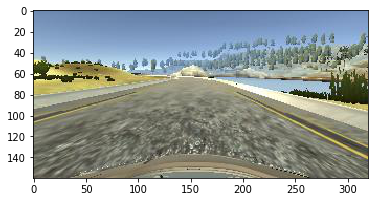

100


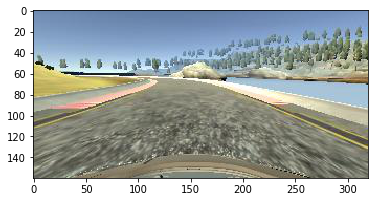

200


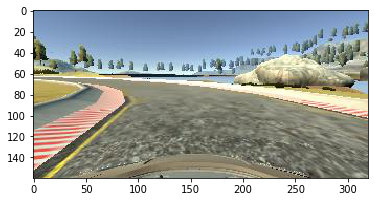

300


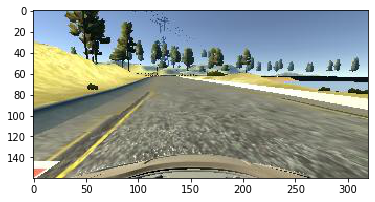

400


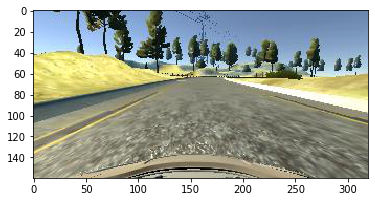

500


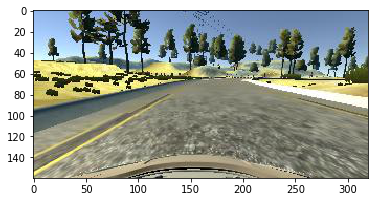

600


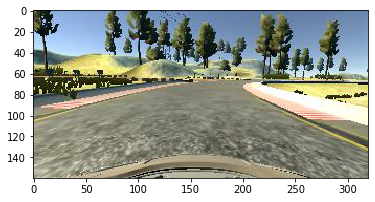

700


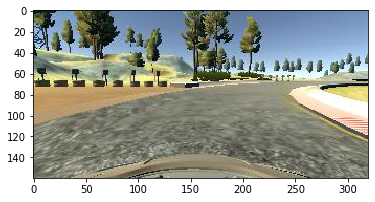

800


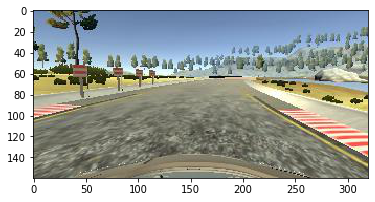

900


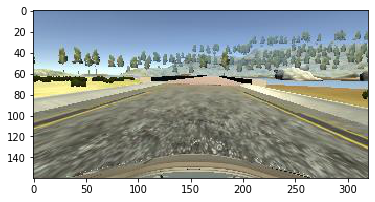

In [4]:
for i in range(0,1000,100):
    img = mpimg.imread(dlog.iloc[i].center)
    print(i)
    plt.imshow(img)
    plt.show()
    

In [5]:
img.shape

(160, 320, 3)

In [6]:
from helper import *
from line import *

[[-5.00000000e-01 -2.66666667e+00  2.40000000e+02]
 [ 3.93531361e-15 -3.16666667e+00  2.40000000e+02]
 [ 2.51650552e-17 -1.66666667e-02  1.00000000e+00]]


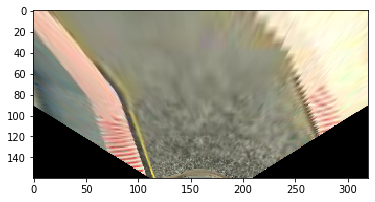

In [7]:
img = mpimg.imread(dlog.iloc[200].center)
sdy = 0
src = np.array([[110, 110 + sdy], #l high
                [60, 160], #l low
                [210, 110 + sdy], #r high
                [260, 160]], dtype=np.float32)#r low 
dx = 10
dy = 0
target = np.array([[4*(110-160)//5+160+dx, 130+dy], #l high
                   [4*(110-160)//5+160+dx, 160],#l low
                   [4*(210-160)//5+160-dx, 130+dy], #r high
                   [4*(210-160)//5+160-dx, 160]], dtype=np.float32)#r low 

warped, M = Warp(img, src, target, mat=True)

plt.imshow(warped)
print(M)

In [8]:
M

array([[-5.00000000e-01, -2.66666667e+00,  2.40000000e+02],
       [ 3.93531361e-15, -3.16666667e+00,  2.40000000e+02],
       [ 2.51650552e-17, -1.66666667e-02,  1.00000000e+00]])

In [9]:
len(dlog)

2797

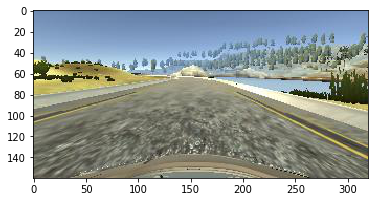

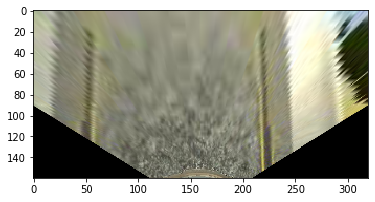

-0.009433961999999999


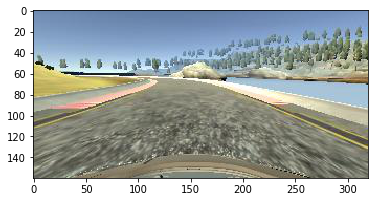

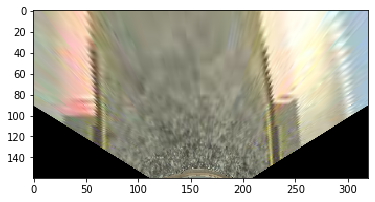

-0.009433961999999999


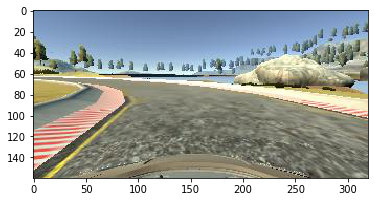

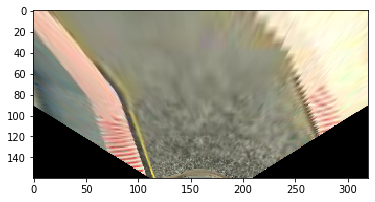

-0.1415094


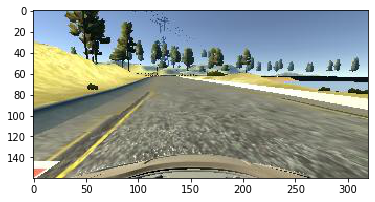

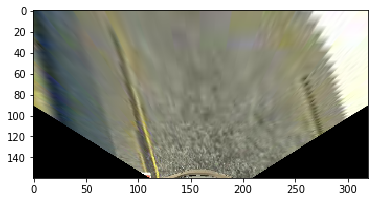

-0.09433963


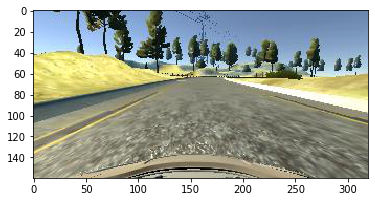

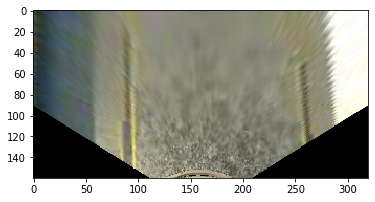

-0.009433961999999999


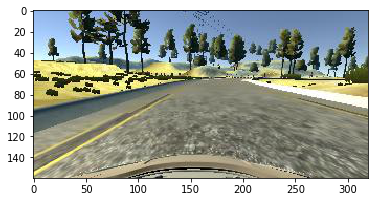

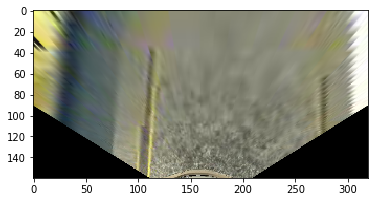

0.1132075


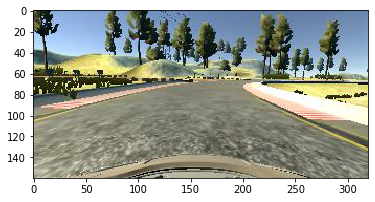

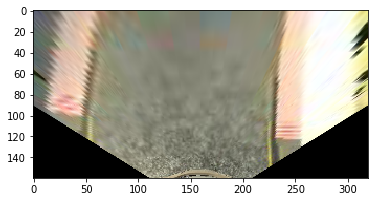

0.02830189


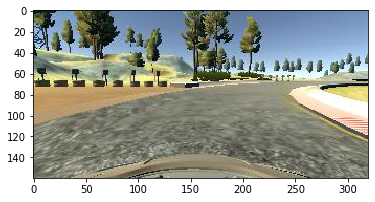

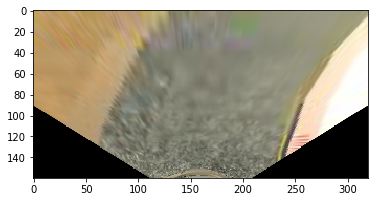

0.2735849


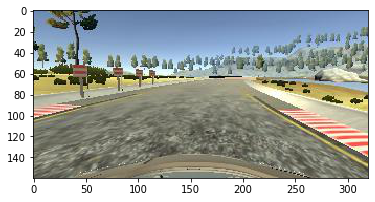

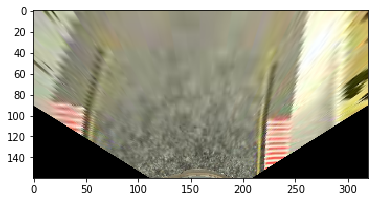

0.0754717


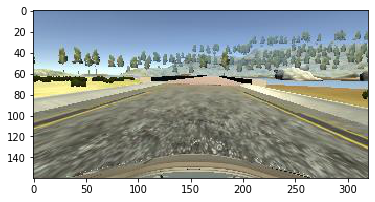

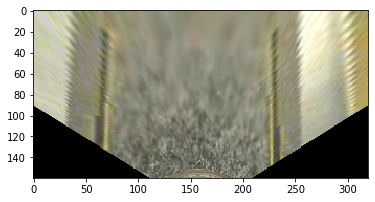

0.03773585


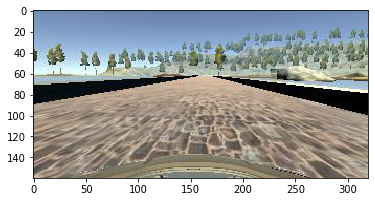

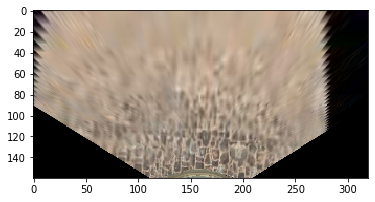

-0.009433961999999999


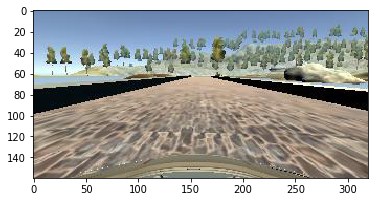

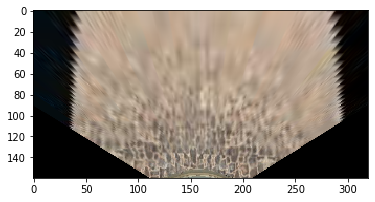

0.04716982


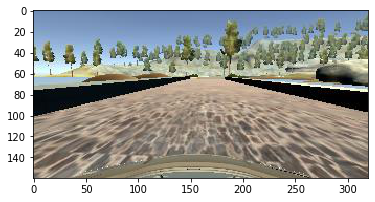

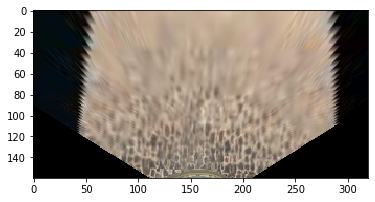

0.02830189


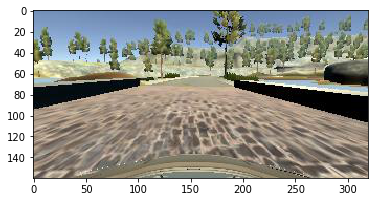

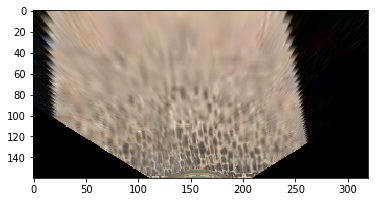

-0.01886792


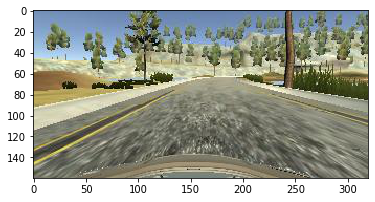

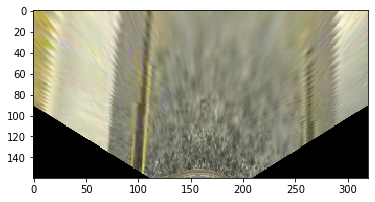

0.1415094


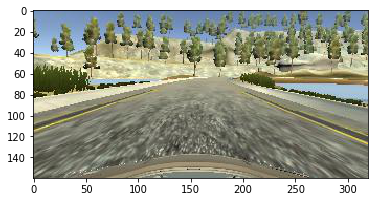

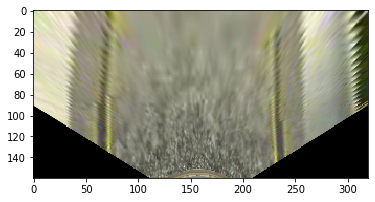

0.02830189


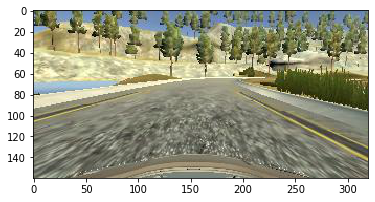

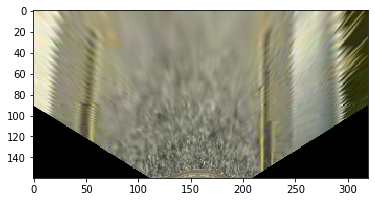

0.02830189


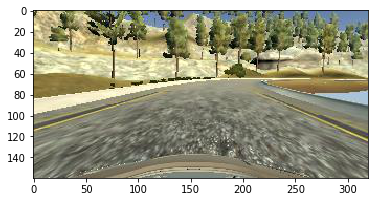

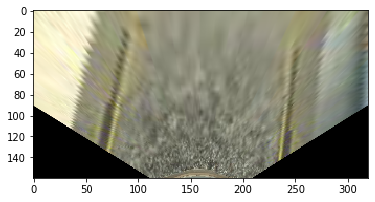

0.09433963


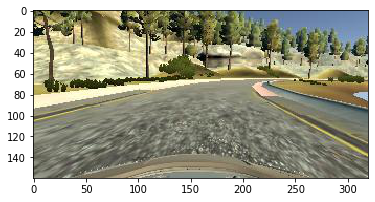

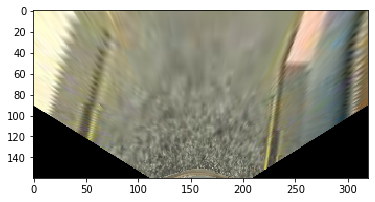

0.1132075


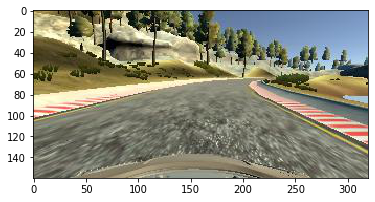

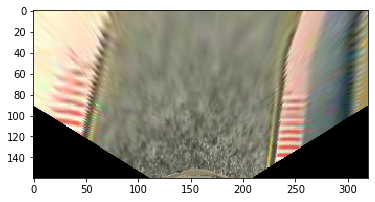

0.1415094


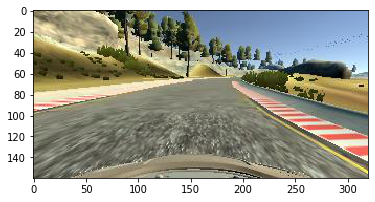

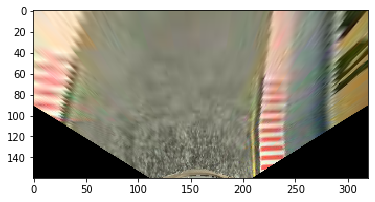

0.09433963


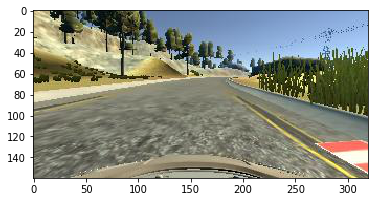

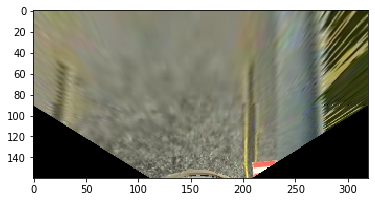

0.03773585


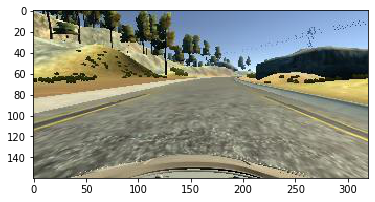

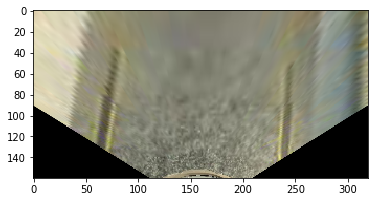

0.09433963


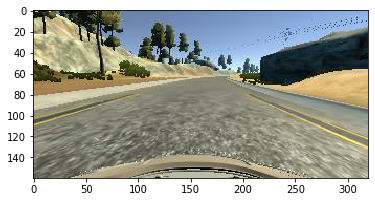

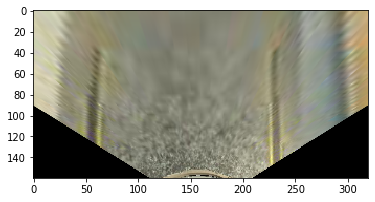

0.02830189


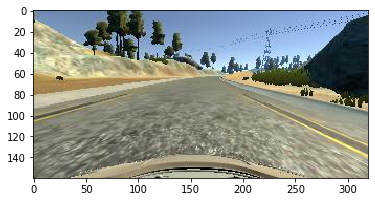

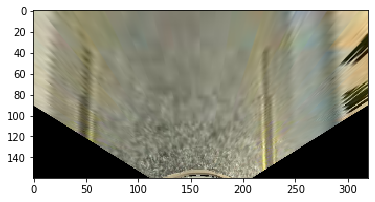

0.02830189


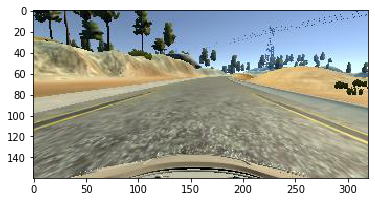

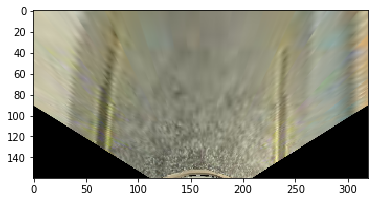

0.0


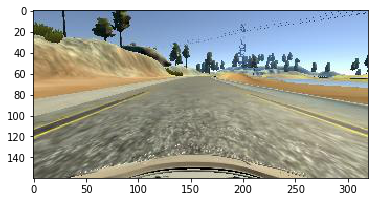

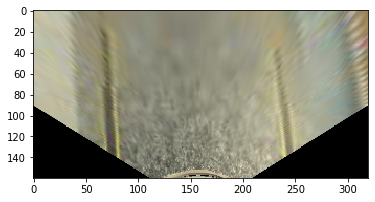

0.04716982


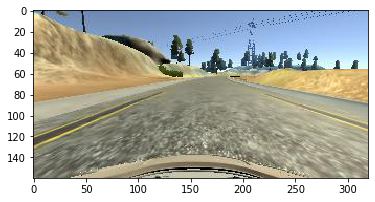

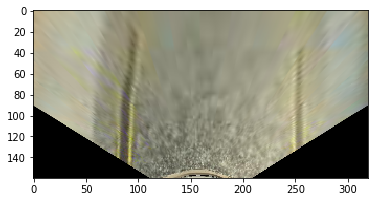

0.04716982


In [10]:
#%time
for i in range(0,len(dlog),100):
    img = mpimg.imread(dlog.iloc[i].center)
    plt.imshow(img)
    plt.show()
    warped = Warp(img, src, target, mat=False)

    plt.imshow(warped)
    plt.show()
    
    print(dlog.steering.iloc[i])

In [11]:
def Warp(img, src, target, mat=False):
    try:
        y, x, c = img.shape
    except:
        y, x = img.shape
    #img = cv2.undistort(img, mtx, dist, None, mtx)

    M = cv2.getPerspectiveTransform(src, target)
    
    warped = cv2.warpPerspective(img, M, (x, y), flags=cv2.INTER_LINEAR)
    if mat:
        return warped, M
    return warped

class Net(K.Model):
    def __init__(self, decode = False):
        super().__init__()
        self.decode = decode

        self.encoder = K.Sequential( [
            ll.Conv2D(16, 3, input_shape=(160,320,3), padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D(),
            #ll.Dropout(0.5),
            
            ll.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D(),
            #ll.Dropout(0.5),
            
            ll.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D(),
            #ll.Dropout(0.5),
            
            ll.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D(),
            #ll.Dropout(0.5),
            
            ll.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D()])

        if decode:
            self.decoder = K.Sequential([
                ll.UpSampling2D(input_shape=(5,10,64)),
                ll.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
                
                ll.UpSampling2D(),
                ll.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
                
                ll.UpSampling2D(),
                ll.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
                
                ll.UpSampling2D(),
                ll.Conv2D(32, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
                
                ll.UpSampling2D(),
                ll.Conv2D(3, 3, padding='same', activation='sigmoid', kernel_regularizer=K.regularizers.l2(0.001))])
            
        self.predict_conv =  K.Sequential( [
            ll.Conv2D(64, 3, input_shape=(5,10,64), padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.Conv2D(64, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.MaxPool2D(),
            ll.Conv2D(128, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.Conv2D(128, 3, padding='same', activation='relu', kernel_regularizer=K.regularizers.l2(0.001)),
            ll.GlobalMaxPool2D()])

        self.predict = K.Sequential([
            ll.Dense(256, input_shape=(128,), activation='relu'),
            ll.Dropout(0.5),
            ll.Dense(256, activation='relu'),
            ll.Dropout(0.5),
            ll.Dense(1, activation='sigmoid')
        ])
        self.epochs = 0
        

    def call(self, warped):
        if self.decode:
            encoded = self.encoder(warped)
            decoded = self.decoder(encoded)
            predict_conved = self.predict_conv(encoded)
            predicted = self.predict(predict_conved) - 0.5
            return predicted, decoded
        else:
            encoded = self.encoder(warped)
            predict_conved = self.predict_conv(encoded)
            predicted = self.predict(predict_conved) - 0.5
            return predicted

    def save_model(self, path='model_check_points'):
        self.encoder.save(f"{path}/encoder")
        
        if self.decode:
            self.decoder.save(f"{path}/decoder")

        self.predict_conv.save(f"{path}/predict_conv")
        self.predict.save(f"{path}/predict")

    def load_model(self, path='model_check_points'):
        self.encoder = K.models.load_model(f"{path}/encoder")
        if self.decode:
            self.decoder = K.models.load_model(f"{path}/decoder")
        self.predict_conv = K.models.load_model(f"{path}/predict_conv")
        self.predict = K.models.load_model(f"{path}/predict")

class Trainer:
    def __init__(self, net, directory='Train_capture'):
        self.net = net
        self.index = 0

        self.directory = directory

        self.index += len(os.listdir((directory+'/img')))

    def record(self, img, steering):
        img = img.reshape(160,320,3)
        mpimg.imsave(f"{self.directory}/img/{self.index}.jpg", img)
        with open(f"{self.directory}/steering.csv", "a") as f:
            f.write(f"{steering}\n")
        self.index += 1



    def train(self, batch_size=64, epochs=4, save=True):
        criterion = losses.mean_squared_error
        optimizer = optim.Adam(lr=0.001)
        loops = self.index//batch_size
        df = pd.read_csv(f'{self.directory}/steering.csv')
        for e in range(epochs):
            for i in range(loops):
                B = np.random.randint(0,self.index, size=batch_size)
                X = np.zeros((batch_size, 160, 320, 3))
                S = np.zeros((batch_size, 1))
                for b in range(batch_size):
                    X[b] = Warp(mpimg.imread(f'{self.directory}/img/{B[b]}.jpg'), src, target)/256

                    X = np.array(X, dtype=np.float32)

                    S[b] = df.iloc[B[b]].steering
                    if np.random.choice([True,False]):
                        X[b] = np.flip(X[b], 1)
                        S[b] = -S[b]

                    else:
                        pass
                if self.net.decode:
                    with tf.GradientTape() as t:

                        output, dec = self.net(X)

                        loss1 = losses.MSE(S, output)

                    grads = t.gradient(loss1, self.net.encoder.trainable_variables +  self.net.predict_conv.trainable_variables + self.net.predict.trainable_variables)
                    optimizer.apply_gradients(zip(grads, self.net.encoder.trainable_variables +  self.net.predict_conv.trainable_variables + self.net.predict.trainable_variables))

                    with tf.GradientTape() as t:

                        output, dec = self.net(X)

                        loss2 = losses.MAE(X, dec)

                    grads = t.gradient(loss2, self.net.encoder.trainable_variables+ self.net.decoder.trainable_variables)
                    optimizer.apply_gradients(zip(grads, self.net.encoder.trainable_variables+ self.net.decoder.trainable_variables))
                    """
                    if e+i == 0:
                        self.net.compile(optimizer='adam', loss='MSE')
                        self.net.fit(X,S, batch_size=batch_size, shuffle=False)"""
                    print(f"epochs {self.net.epochs} | loss1 = {np.sum(loss1):.2f} | loss2 = {np.sum(loss2):.2f}\n")

                else:
                    with tf.GradientTape() as t:

                        output = self.net(X)

                        loss = losses.MSE(S, output)

                    grads = t.gradient(loss, self.net.trainable_variables)
                    optimizer.apply_gradients(zip(grads, self.net.trainable_variables))
                    """
                    if e+i == 0:
                        self.net.compile(optimizer='adam', loss='MSE')
                        self.net.fit(X,S, batch_size=batch_size, shuffle=False)"""
                    print(f"epochs {self.net.epochs} | loss1 = {np.sum(loss):.2f}\n")

            self.net.epochs += 1
            if save:
                self.net.save_model('model_check_points')


    def validate(self, dlog, path='validation_output/img'):
        try:
            self.net.load_model()
            print("Load successful")
        except:
            print("Failed to load model checkpoints")
            print("continue validatin anyway?")
            k = input("[Y]/n")
            
            if k=='n':
                return 1
            else:
                pass
            
        
        actual = dlog.steering.values
        left = np.zeros_like(actual)
        center = np.zeros_like(actual)
        right = np.zeros_like(actual)
        
        for i in range(len(dlog)):
            # mini batch_size of 3 for left, center, right image.
            warped = np.zeros((3,160,320,3))
            
            img_l = mpimg.imread(dlog.iloc[i].left)
            warped[0,:,:,:] = Warp(img_l, src, target, mat=False)/256
            
            img_c = mpimg.imread(dlog.iloc[i].center)
            warped[1,:,:] = Warp(img_c, src, target, mat=False)/256
            
            img_r = mpimg.imread(dlog.iloc[i].right)
            warped[2,:,:] = Warp(img_r, src, target, mat=False)/256
            
            if self.net.decode:
                steer, decode = self.call(warped)
                decode = np.array(decode)
                mpimg.imsave(f'{path}/decoded_{i}_l.jpg', decode[0])
                mpimg.imsave(f'{path}/decoded_{i}_c.jpg', decode[1])
                mpimg.imsave(f'{path}/decoded_{i}_r.jpg', decode[2])
            else:
                steer = self.net.call(warped)
                
            steer = np.array(steer)
            
            left[i] = steer[0][0]
            center[i] = steer[1][0]
            right[i] = steer[2][0]
        
        return actual, left, center, right
            
            
            

In [33]:
net = Net()
tr = Trainer(net)
actual, left, center, right = tr.validate(dlog)

Load successful


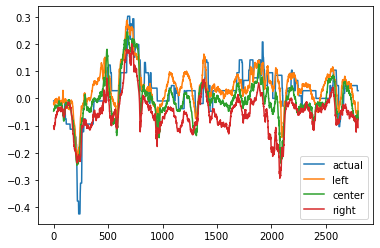

In [37]:
plt.plot(range(len(actual)), actual, label='actual')
plt.plot(range(len(actual)), left, label='left')
plt.plot(range(len(actual)), center, label='center')
plt.plot(range(len(actual)), right, label='right')
plt.legend()

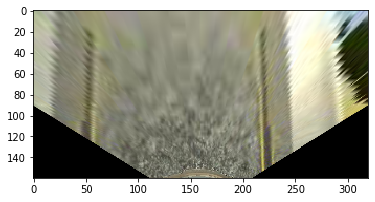

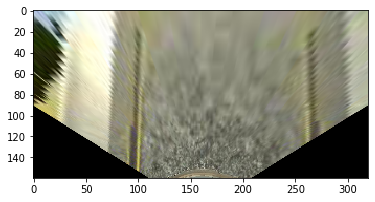

/home/hyunkun/anaconda3/envs/tensorflow2/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


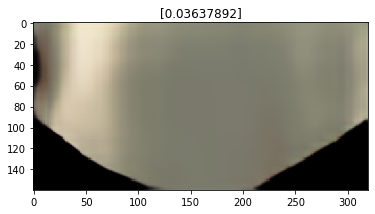

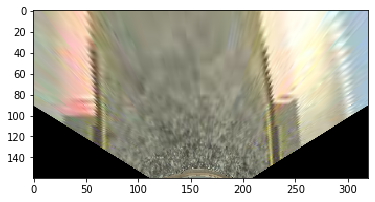

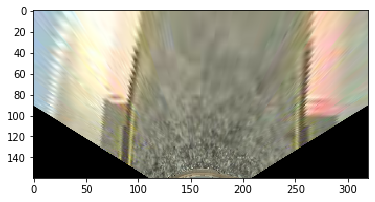

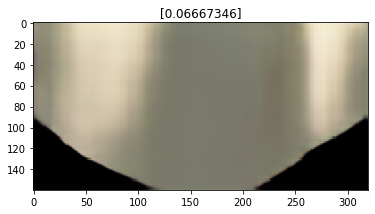

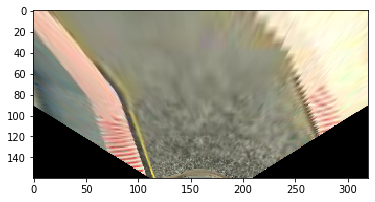

...

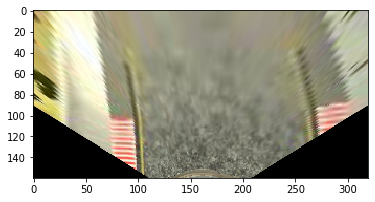

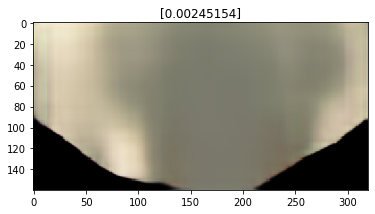

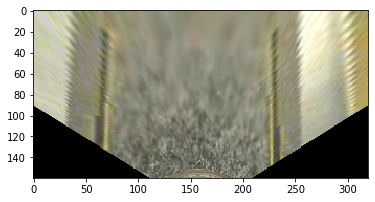

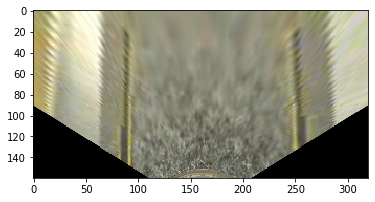

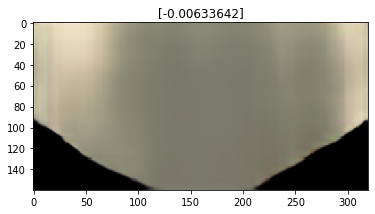

In [14]:
net = Net(decode=True)
net.load_model()
for i in range(0, 1000, 100):
    img = mpimg.imread(dlog.iloc[i].center)
    
    warped = Warp(img, src, target)
    plt.imshow(warped)
    #plt.imshow(img)
    plt.show()
    
        
    flipped = np.flip(warped, axis=1)
    #flipped = np.flip(img, axis=1)
    plt.imshow(flipped)
    plt.show()
    X = flipped/256
    X = np.array(X, dtype=np.float32)
    steer, dec = net(X.reshape(1,160,320,3))
    steer = np.array(steer)
    dec = np.array(dec)
    plt.imshow(dec[0])
    plt.title(steer[0])
    plt.show()

In [32]:
!nvidia-smi

Wed Apr  1 05:46:08 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  TITAN RTX           Off  | 00000000:C1:00.0 Off |                  N/A |
| 44%   57C    P2    71W / 280W |  23559MiB / 24217MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  